In [1]:
import os
import numpy as np
import xarray as xr
import geopandas as gpd
import clima_anom as ca

import shapely.vectorized as sv

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
from matplotlib.colors import BoundaryNorm

import sys
sys.path.append(os.path.abspath(".."))
from function import ART_downscale as ART_down
from function import DOWN_raw

In [2]:
lon_min, lon_max, lat_min, lat_max, area, toll = 6.5, 19, 36.5, 48, 'ITALY', 0.002

Tr = [5,  10,  20,  50, 100, 200]
Fi = 1 - 1/np.array(Tr)

In [3]:
veneto_dir = os.path.join('/','media','arturo','T9','Data','shapes','Europa','Italy')

if os.path.exists(veneto_dir):
    REGIONS = gpd.read_file(os.path.join(veneto_dir,'Italy_regions.geojson'))
    DEM = gpd.read_file(os.path.join(veneto_dir,'DEM','Italy_dem_800.geojson')) 
    ITALY = gpd.read_file(os.path.join(veneto_dir,'Italy_clear.geojson'))
else:
    raise SystemExit(f"File not found: {veneto_dir}")

In [4]:
sat_base = os.path.join('/','media','arturo','T9','Data','Italy','Satellite')
down_base = os.path.join(sat_base,'5_DOWN')
down_corrected = os.path.join(sat_base, '6_DOWN_BCorrected')
ENS_base = os.path.join(sat_base,'5_ENSEMBLE')

## GEV

In [5]:
dir_in = os.path.join(sat_base, 'IMERG', '1dy', 'IMERG_Italy_1dy_2000_06_01_2024_02_29.nc')
DATA = xr.open_dataset(dir_in)

lon2dIM, lat2dIM = np.meshgrid(DATA.lon.values, DATA.lat.values)

PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(PRE)

IMERG_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        csi, psi, mu = DOWN_raw.gev_fit_lmom(PRE[:,i,j][PRE[:,i,j] > 1.0])
        IMERG_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

In [6]:
dir_in = os.path.join(sat_base, 'CMORPH', '1dy', 'CMORPH_Italy_1dy_1998_01_01_2024_01_31.nc')
DATA = xr.open_dataset(dir_in)

lon2dCM, lat2dCM = np.meshgrid(DATA.lon.values, DATA.lat.values)

PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(PRE)

CMORPH_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        csi, psi, mu = DOWN_raw.gev_fit_lmom(PRE[:,i,j][PRE[:,i,j] > 1.0])
        CMORPH_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

In [7]:
dir_in = os.path.join(sat_base, 'MSWEP', '1dy', 'MSWEP_Italy_1dy_1980_01_01_2023_12_31.nc')
DATA = xr.open_dataset(dir_in)

lon2dMS, lat2dMS = np.meshgrid(DATA.lon.values, DATA.lat.values)

PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(PRE)

MSWEP_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        csi, psi, mu = DOWN_raw.gev_fit_lmom(PRE[:,i,j][PRE[:,i,j] > 1.0])
        MSWEP_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

In [8]:
dir_in = os.path.join(sat_base, 'ERA5', '1dy', 'ERA5_Italy_1dy_2000_01_01_2023_12_31.nc')
DATA = xr.open_dataset(dir_in)

lon2dER, lat2dER = np.meshgrid(DATA.lon.values, DATA.lat.values)

PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(PRE)

ERA5_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        csi, psi, mu = DOWN_raw.gev_fit_lmom(PRE[:,i,j][PRE[:,i,j] > 1.0])
        ERA5_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

In [9]:
dir_in = os.path.join(sat_base, 'GSMaP', '1dy', 'GSMaP_Italy_1dy_2002_01_01_2024_12_31.nc')
DATA = xr.open_dataset(dir_in)

lon2dGS, lat2dGS = np.meshgrid(DATA.lon.values, DATA.lat.values)

PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(PRE)

GSMaP_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        csi, psi, mu = DOWN_raw.gev_fit_lmom(PRE[:,i,j][PRE[:,i,j] > 1.0])
        GSMaP_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

In [10]:
dir_in = os.path.join(sat_base, 'CHIRPS', '1dy', 'CHIRPS_Italy_1dy_1981_01_01_2024_06_30.nc')
DATA = xr.open_dataset(dir_in)

lon2dCH, lat2dCH = np.meshgrid(DATA.lon.values, DATA.lat.values)

PRE = DATA.PRE.values
ntime, nlat, nlon = np.shape(PRE)

CHIRPS_GEV = np.zeros([len(Tr),nlat,nlon])
for i in range(nlat):
    for j in range(nlon):
        tmp = PRE[:,i,j][PRE[:,i,j] > 1.0]
        if len(tmp) == 0:
            CHIRPS_GEV[:,i,j] = np.nan
        else:
            csi, psi, mu = DOWN_raw.gev_fit_lmom(tmp)
            CHIRPS_GEV[:,i,j] = DOWN_raw.gev_quant(Fi, csi, psi, mu)

In [11]:
pos = 4
print(f'Tr: {Tr[pos]} years')

Tr: 100 years


In [12]:
if pos == 3:
    GEV_levels = np.arange(10,100,10)
    GEV_norm = mcolors.BoundaryNorm(boundaries=GEV_levels, ncolors=GEV_cmap.N, extend='max')
else:
    GEV_levels = None
    GEV_norm = None

Export figure to: ../figures/Article_down/Quantiles_ALL_GEV_100yrs.png


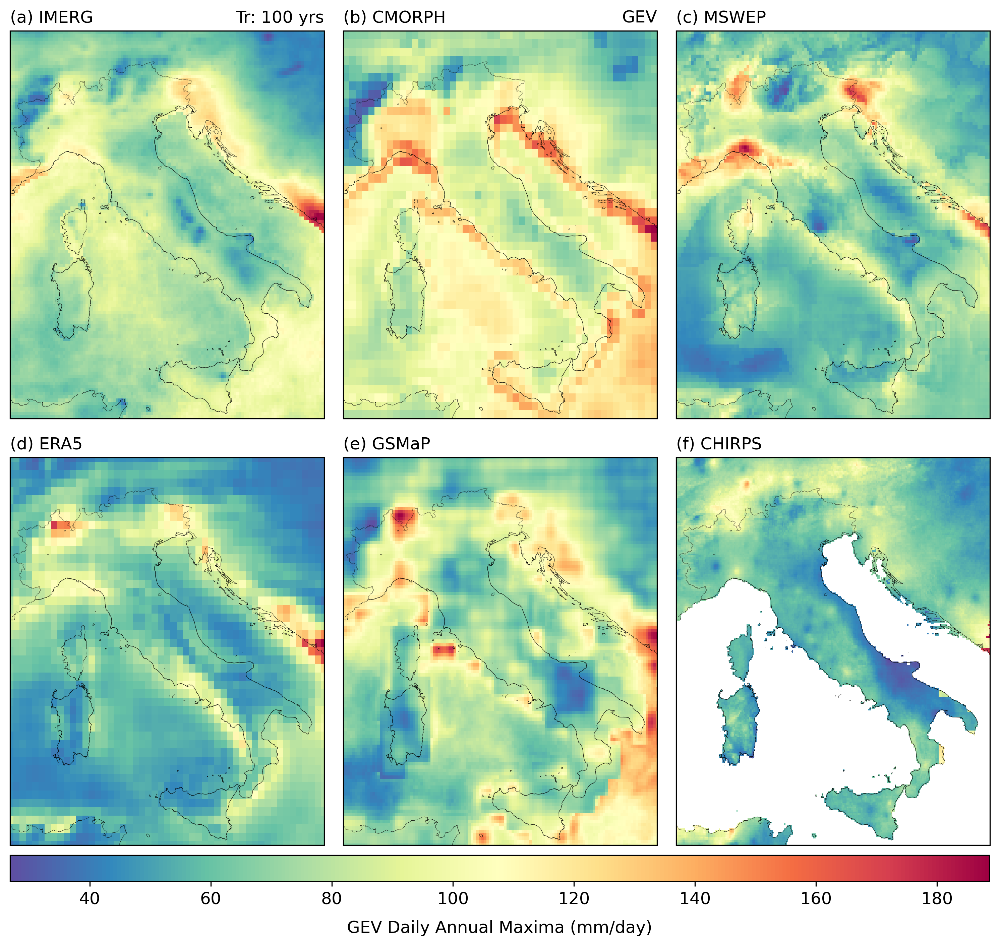

In [13]:
fonttitle = 12

GEV_cmap = plt.cm.Spectral_r


proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2dIM, lat2dIM, IMERG_GEV[pos,:,:], cmap=GEV_cmap, norm=GEV_norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2dCM, lat2dCM, CMORPH_GEV[pos,:,:], cmap=GEV_cmap, norm=GEV_norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2dMS, lat2dMS, MSWEP_GEV[pos,:,:], cmap=GEV_cmap, norm=GEV_norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2dER, lat2dER, ERA5_GEV[pos,:,:], cmap=GEV_cmap, norm=GEV_norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2dGS, lat2dGS, GSMaP_GEV[pos,:,:], cmap=GEV_cmap, norm=GEV_norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2dCH, lat2dCH, CHIRPS_GEV[pos,:,:], cmap=GEV_cmap, norm=GEV_norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) IMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) CMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'GEV', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) MSWEP', fontsize=fonttitle, loc='left')
axes[3].set_title('(d) ERA5', fontsize=fonttitle, loc='left')
axes[4].set_title('(e) GSMaP', fontsize=fonttitle, loc='left')
axes[5].set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("GEV Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','Article_down',f'Quantiles_ALL_GEV_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


## MEV downscaling

In [64]:
italy_geom = ITALY.union_all()

In [67]:
product, time_reso = 'IMERG', '1dy'
dir_in = os.path.join(down_base, f'ITALY_DOWN_{product}_{time_reso}_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc')

DATA = xr.open_dataset(dir_in)

lon2dIM, lat2dIM = np.meshgrid(DATA.lon.data, DATA.lat.data)

MEVs_IM = DATA.Mev_s.data
MEVd_IM = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dIM, lat2dIM)
MEVd_IM = MEVd_IM.where(mask_italy)

In [69]:
product, time_reso = 'CMORPH', '3h'
dir_in = os.path.join(down_base, f'ITALY_DOWN_{product}_{time_reso}_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc')

DATA = xr.open_dataset(dir_in)

lon2dCM, lat2dCM = np.meshgrid(DATA.lon.data, DATA.lat.data)

MEVs_CM = DATA.Mev_s.data
MEVd_CM = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dCM, lat2dCM)
MEVd_CM = MEVd_CM.where(mask_italy)

In [70]:
product, time_reso = 'ERA5', '3h'
dir_in = os.path.join(down_base, f'ITALY_DOWN_{product}_{time_reso}_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc')

DATA = xr.open_dataset(dir_in)

lon2dER, lat2dER = np.meshgrid(DATA.lon.data, DATA.lat.data)

MEVs_ER = DATA.Mev_s.data
MEVd_ER = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dER, lat2dER)
MEVd_ER = MEVd_ER.where(mask_italy)

In [71]:
product, time_reso = 'MSWEP', '3h'
dir_in = os.path.join(down_base, f'ITALY_DOWN_{product}_{time_reso}_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc')

DATA = xr.open_dataset(dir_in)

lon2dMS, lat2dMS = np.meshgrid(DATA.lon.data, DATA.lat.data)

MEVs_MS = DATA.Mev_s.data
MEVd_MS = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dMS, lat2dMS)
MEVd_MS = MEVd_MS.where(mask_italy)

In [72]:
product, time_reso = 'CHIRPS', '1dy'
dir_in = os.path.join(down_base, f'ITALY_DOWN_{product}_{time_reso}_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc')

DATA = xr.open_dataset(dir_in)

lon2dCH, lat2dCH = np.meshgrid(DATA.lon.data, DATA.lat.data)

MEVs_CH = DATA.Mev_s.data
MEVd_CH = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dCH, lat2dCH)
MEVd_CH = MEVd_CH.where(mask_italy)

In [73]:
product, time_reso = 'GSMaP', '3h'
dir_in = os.path.join(down_base, f'ITALY_DOWN_{product}_{time_reso}_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc')

DATA = xr.open_dataset(dir_in)

lon2dGS, lat2dGS = np.meshgrid(DATA.lon.data, DATA.lat.data)

MEVs_GS = DATA.Mev_s.data
MEVd_GS = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dGS, lat2dGS)
MEVd_GS = MEVd_GS.where(mask_italy)

NGS = DATA.NYd.values
CGS = DATA.CYd.values
WGS = DATA.WYd.values
Fi = 1 - 1/np.array(Tr)

In [74]:
GSMAP2 = ART_down.pre_quantiles_array(
                        NGS, 
                        CGS, 
                        WGS, 
                        Tr, 
                        DATA.lat.data, DATA.lon.data,
                        1)

/home/arturo/github/downpy/function/ART_downscale.py:388: RuntimeWarning: invalid value encountered in power
  mev0f = np.sum( ( 1-np.exp(-(y/C)**W ))**N) - nyears*pr


In [6]:
ENSEMBLE_SAT = 'ALL'
product, time_reso = 'ENSEMBLE_mean', '1dy'
dir_in = os.path.join(ENS_base,f'ITALY_ENSEMBLE_{ENSEMBLE_SAT}_{time_reso}_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_mean.nc')

DATA = xr.open_dataset(dir_in)

lon2dEN, lat2dEN = DATA.lon.data, DATA.lat.data

MEVs_MEAN = DATA.Mev_s.data
MEVd_MEAN = DATA.Mev_d.data

In [22]:
ENSEMBLE_SAT = 'ALL'
product, time_reso = 'ENSEMBLE_median', '1dy'
dir_in = os.path.join(ENS_base,f'ITALY_ENSEMBLE_{ENSEMBLE_SAT}_{time_reso}_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_median.nc')

DATA = xr.open_dataset(dir_in)

MEVs_MEDIAN = DATA.Mev_s.data
MEVd_MEDIAN = DATA.Mev_d.data

In [23]:
pos = 3
print(f'Plotting for return period: {Tr[pos]} years')

if pos == 0: #5 years
    Mev_levels = np.arange(20, 200, 20)
elif pos == 1: #10 years
    Mev_levels = np.arange(20, 220, 20)
elif pos == 3: #50 years
    Mev_levels = np.arange(20, 320, 20)
elif pos == 4: #100 years
    Mev_levels = np.arange(20, 400, 20)
elif pos == 5: #200 years
    Mev_levels = np.arange(40, 480, 40)
else:
    Mev_levels = None

Plotting for return period: 50 years


In [24]:
print(f'IMERG  max: {np.nanmax(MEVs_IM[pos,:,:])}')
print(f'CMORPH max: {np.nanmax(MEVs_CM[pos,:,:])}')
print(f'MSWEP  max: {np.nanmax(MEVs_MS[pos,:,:])}')
print(f'ERA5   max: {np.nanmax(MEVs_ER[pos,:,:])}')
print(f'GSMaP  max: {np.nanmax(MEVs_GS[pos,:,:])}')
print(f'CHIRPS max: {np.nanmax(MEVs_CH[pos,:,:])}')
print(f'Mean   max: {np.nanmax(MEVs_MEAN[pos,:,:])}')
print(f'Median max: {np.nanmax(MEVs_MEDIAN[pos,:,:])}')
print(f'MAX VALUE : {np.max([np.nanmax(MEVs_IM[pos,:,:]),np.nanmax(MEVs_CM[pos,:,:]), np.nanmax(MEVs_MS[pos,:,:]), np.nanmax(MEVs_ER[pos,:,:]), np.nanmax(MEVs_GS[pos,:,:]), np.nanmax(MEVs_CH[pos,:,:]), np.nanmax(MEVs_MEAN[pos,:,:]), np.nanmax(MEVs_MEDIAN[pos,:,:])])}')

IMERG  max: 326.64285469834664
CMORPH max: 305.0774074319085
MSWEP  max: 256.97527094125826
ERA5   max: 284.57020791767894
GSMaP  max: 422.3509956193834
CHIRPS max: 295.12057666
Mean   max: 311.8072539805124
Median max: 233.862163525044
MAX VALUE : 422.3509956193834


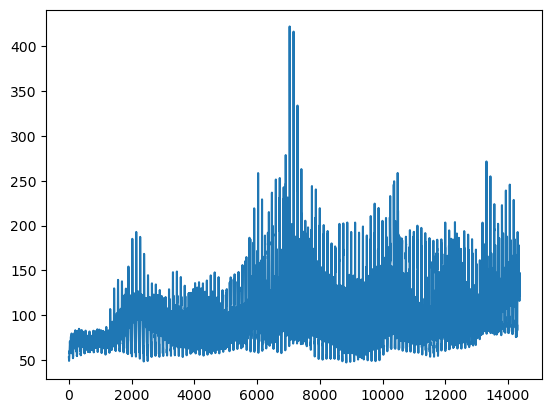

In [25]:
plt.plot(MEVs_GS[pos,:,:].flatten())

In [26]:
MEVs_CH = np.where(MEVs_CH==0,np.nan,MEVs_CH)
MEVd_CH = np.where(MEVd_CH==0,np.nan,MEVd_CH)

In [27]:
if pos == 0: #5 years
    pass
elif pos == 1: #10 years
    pass
elif pos == 3: #50 years
    MEVs_GS[pos,:,:] = np.where(MEVs_GS[pos,:,:]>=300, 300, MEVs_GS[pos,:,:])
elif pos == 4: #100 years
    MEVs_GS[pos,:,:] = np.where(MEVs_GS[pos,:,:]>=380, 380, MEVs_GS[pos,:,:])
elif pos == 5: #200 years
    MEVs_GS[pos,:,:] = np.where(MEVs_GS[pos,:,:]>=430, 430, MEVs_GS[pos,:,:])
else:
    Mev_levels = None

Export figure to: ../figures/Article_down/Quantiles_ALL_MEV_50yrs.png


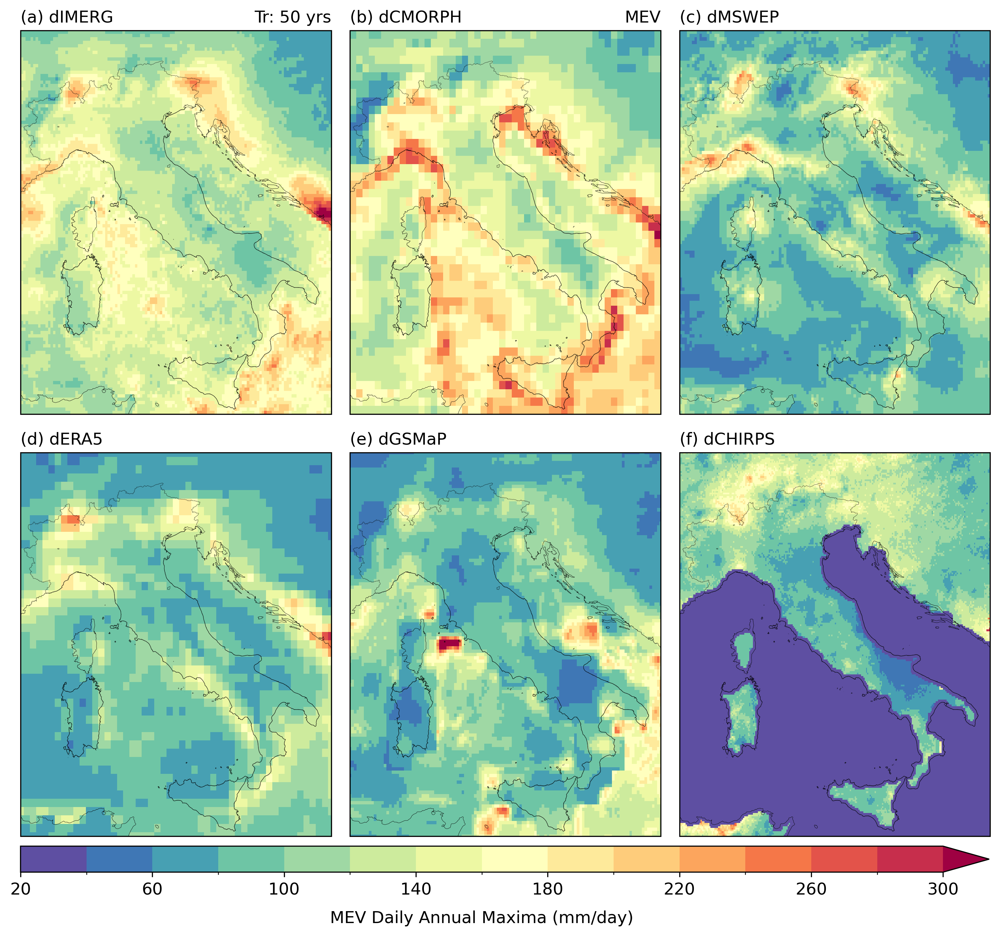

In [84]:
fonttitle = 12

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r
# norm = BoundaryNorm(Mev_levels, Mev_cmap.N)
norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2dIM, lat2dIM, MEVs_IM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2dCM, lat2dCM, MEVs_CM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2dMS, lat2dMS, MEVs_MS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2dER, lat2dER, MEVs_ER[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2dGS, lat2dGS, MEVs_GS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2dCH, lat2dCH, MEVs_CH[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) dIMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) dCMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'MEV', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) dMSWEP', fontsize=fonttitle, loc='left')
axes[3].set_title('(d) dERA5', fontsize=fonttitle, loc='left')
axes[4].set_title('(e) dGSMaP', fontsize=fonttitle, loc='left')
axes[5].set_title('(f) dCHIRPS', fontsize=fonttitle, loc='left')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("MEV Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','Article_down',f'Quantiles_ALL_MEV_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Corrected Downscaled Quantiles

In [45]:
italy_geom = ITALY.union_all()

In [ ]:
dir_in = os.path.join(down_corrected, f'ITALY_DOWN_IMERG_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_QQc.nc')
DATA = xr.open_dataset(dir_in)
lon2dIM, lat2dIM = np.meshgrid(DATA.lon.data, DATA.lat.data)
MEVd_IM_QC = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dIM, lat2dIM)
MEVd_IM_QC = MEVd_IM_QC.where(mask_italy)

In [57]:
dir_in = os.path.join(down_corrected, f'ITALY_DOWN_CMORPH_3h_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_QQc.nc')
DATA = xr.open_dataset(dir_in)
lon2dCM, lat2dCM = np.meshgrid(DATA.lon.data, DATA.lat.data)
MEVd_CM_QC = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dCM, lat2dCM)
MEVd_CM_QC = MEVd_CM_QC.where(mask_italy)

In [58]:
dir_in = os.path.join(down_corrected, f'ITALY_DOWN_MSWEP_3h_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_QQc.nc')
DATA = xr.open_dataset(dir_in)
lon2dMS, lat2dMS = np.meshgrid(DATA.lon.data, DATA.lat.data)
MEVd_MS_QC = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dMS, lat2dMS)
MEVd_MS_QC = MEVd_MS_QC.where(mask_italy)

In [59]:
dir_in = os.path.join(down_corrected, f'ITALY_DOWN_ERA5_3h_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_QQc.nc')
DATA = xr.open_dataset(dir_in)
lon2dER, lat2dER = np.meshgrid(DATA.lon.data, DATA.lat.data)
MEVd_ER_QC = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dER, lat2dER)
MEVd_ER_QC = MEVd_ER_QC.where(mask_italy)

In [60]:
dir_in = os.path.join(down_corrected, f'ITALY_DOWN_GSMaP_3h_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_QQc.nc')
DATA = xr.open_dataset(dir_in)
lon2dGS, lat2dGS = np.meshgrid(DATA.lon.data, DATA.lat.data)
MEVd_GS_QC = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dGS, lat2dGS)
MEVd_GS_QC = MEVd_GS_QC.where(mask_italy)

In [61]:
dir_in = os.path.join(down_corrected, f'ITALY_DOWN_CHIRPS_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_QQc.nc')
DATA = xr.open_dataset(dir_in)
lon2dCH, lat2dCH = np.meshgrid(DATA.lon.data, DATA.lat.data)
MEVd_CH_QC = DATA.Mev_d

mask_italy = sv.contains(italy_geom, lon2dCH, lat2dCH)
MEVd_CH_QC = MEVd_CH_QC.where(mask_italy)

In [81]:
if pos == 3: #50 years
    Mev_levels = np.arange(20, 320, 20)
else:
    Mev_levels = None

Export figure to: ../figures/Article_down/Quantiles_ALL_MEVd_corrected_50yrs.png


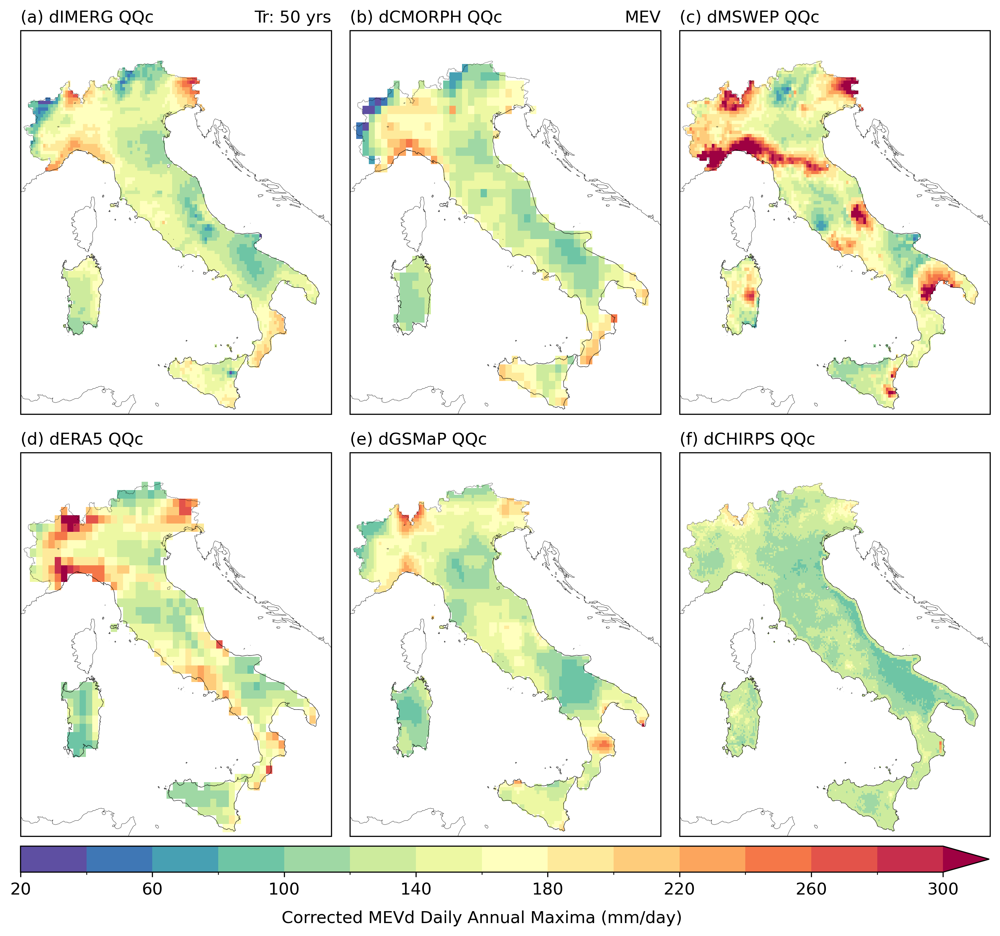

In [82]:
fonttitle = 12

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2dIM, lat2dIM, MEVd_IM_QC[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2dCM, lat2dCM, MEVd_CM_QC[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2dMS, lat2dMS, MEVd_MS_QC[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2dER, lat2dER, MEVd_ER_QC[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2dGS, lat2dGS, MEVd_GS_QC[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2dCH, lat2dCH, MEVd_CH_QC[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) dIMERG QQc', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) dCMORPH QQc', fontsize=fonttitle, loc='left')
axes[1].set_title(f'MEV', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) dMSWEP QQc', fontsize=fonttitle, loc='left')
axes[3].set_title('(d) dERA5 QQc', fontsize=fonttitle, loc='left')
axes[4].set_title('(e) dGSMaP QQc', fontsize=fonttitle, loc='left')
axes[5].set_title('(f) dCHIRPS QQc', fontsize=fonttitle, loc='left')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("Corrected MEVd Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','Article_down',f'Quantiles_ALL_MEVd_corrected_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## without correction

Export figure to: ../figures/Article_down/Quantiles_ALL_MEVd_50yrs.png


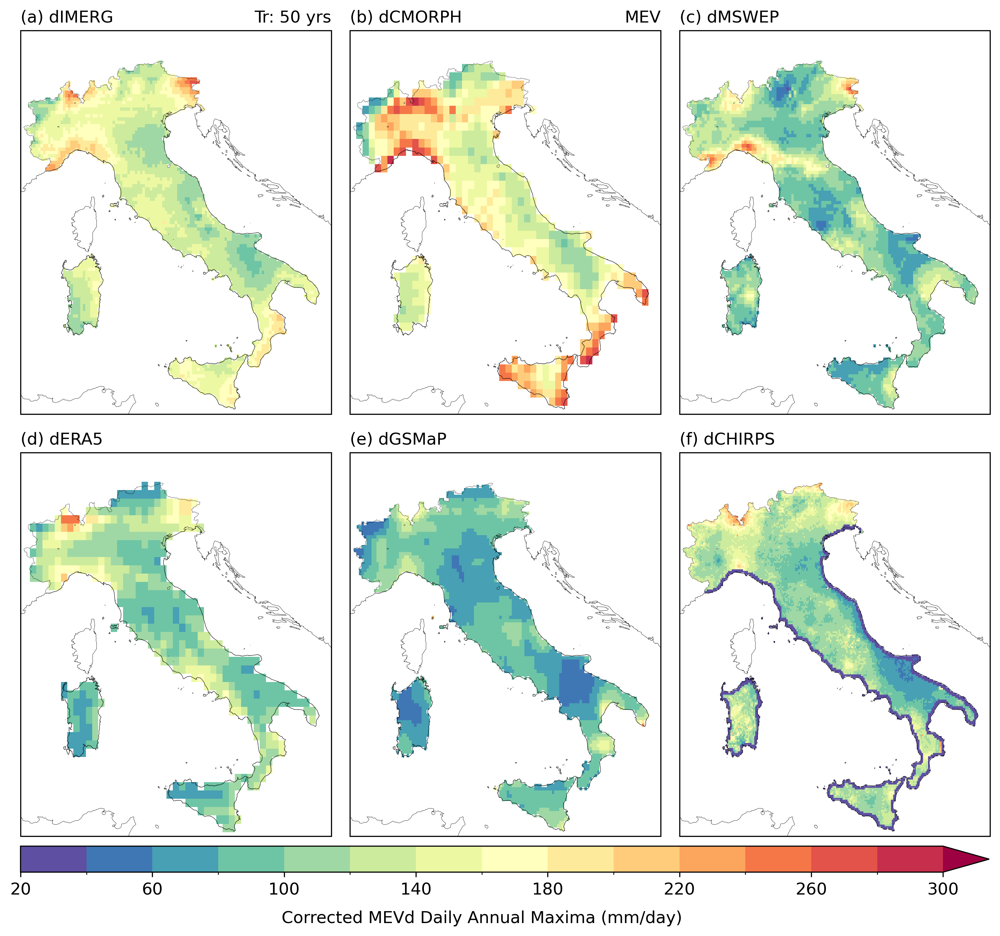

In [83]:
fonttitle = 12

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')
# norm = None

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(11, 9), dpi=300)
gs = gridspec.GridSpec(2, 3)

axes = []
for nraw in range(2):
    for ncol in range(3):
        ax = fig.add_subplot(gs[nraw, ncol], projection=proj)
        # DEM.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.1, zorder=15, alpha=0.6)
        ITALY.plot(facecolor='None', edgecolor='k', ax=ax, linewidth=0.3, zorder=21, alpha=0.5)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
        ax.coastlines(linewidth=0.2)
        axes.append(ax)

a1 = axes[0].pcolormesh(lon2dIM, lat2dIM, MEVd_IM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[0], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[1].pcolormesh(lon2dCM, lat2dCM, MEVd_CM[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[1], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[2].pcolormesh(lon2dMS, lat2dMS, MEVd_MS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[2], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[3].pcolormesh(lon2dER, lat2dER, MEVd_ER[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[3], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[4].pcolormesh(lon2dGS, lat2dGS, MEVd_GS[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[4], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

a1 = axes[5].pcolormesh(lon2dCH, lat2dCH, MEVd_CH[pos,:,:], cmap=Mev_cmap, norm=norm)
# cbar = plt.colorbar(a1, ax=axes[5], fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6)

axes[0].set_title('(a) dIMERG', fontsize=fonttitle, loc='left')
axes[0].set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='right')
axes[1].set_title('(b) dCMORPH', fontsize=fonttitle, loc='left')
axes[1].set_title(f'MEV', fontsize=fonttitle, loc='right')
axes[2].set_title('(c) dMSWEP', fontsize=fonttitle, loc='left')
axes[3].set_title('(d) dERA5', fontsize=fonttitle, loc='left')
axes[4].set_title('(e) dGSMaP', fontsize=fonttitle, loc='left')
axes[5].set_title('(f) dCHIRPS', fontsize=fonttitle, loc='left')

cbar_ax = fig.add_axes([0.057, 0.01, 0.885, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("Corrected MEVd Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.01, hspace=0.1)

salida = os.path.join('..','figures','Article_down',f'Quantiles_ALL_MEVd_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Ensembles included

Export figure to: ../figures/Article_down/Quantiles_ALL_RAW_50yrs.png


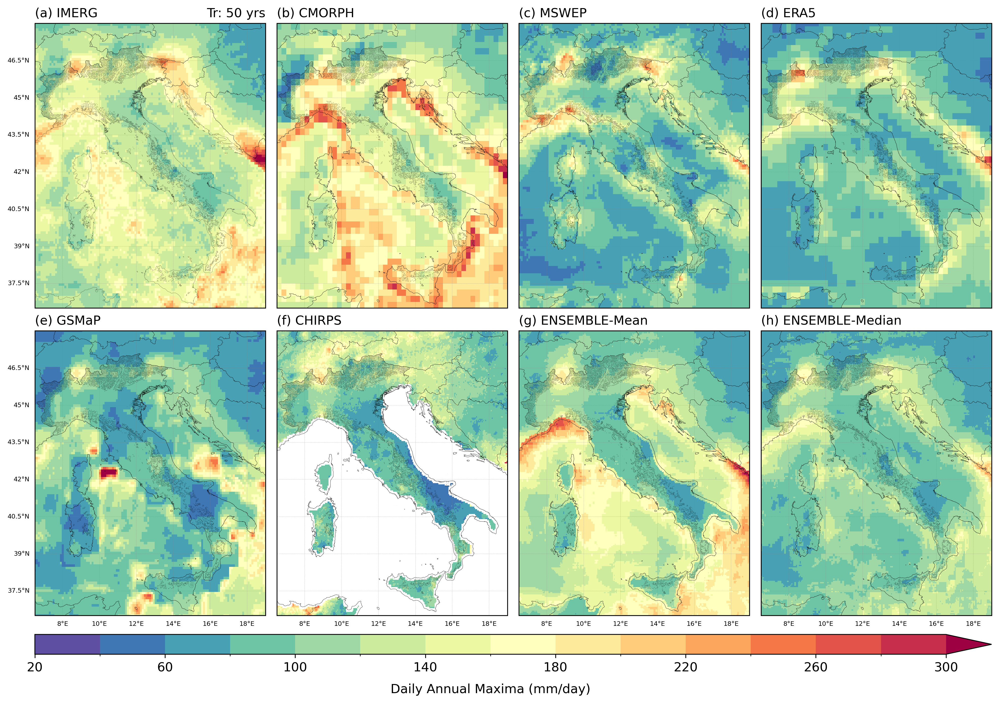

In [ ]:
fonttitle = 12

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r
# norm = BoundaryNorm(Mev_levels, Mev_cmap.N)
norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N, extend='max')

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(14,9),dpi=300)
gs = gridspec.GridSpec(2,4)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.1,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dIM, lat2dIM, MEVs_IM[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dIM, lat2dIM, MEVs_IM[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels = True
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(a) IMERG', fontsize=fonttitle, loc='left')
ax1.set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='right')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dCM, lat2dCM, MEVs_CM[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dCM, lat2dCM, MEVs_CM[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels =False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(b) CMORPH', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 2], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dMS, lat2dMS, MEVs_MS[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dMS, lat2dMS, MEVs_MS[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels =False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(c) MSWEP', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 3], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dER, lat2dER, MEVs_ER[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dER, lat2dER, MEVs_ER[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels = False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(d) ERA5', fontsize=fonttitle, loc='left')

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
ax1 = plt.subplot(gs[1, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dGS, lat2dGS, MEVs_GS[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dGS, lat2dGS, MEVs_GS[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =True
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(e) GSMaP', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dCH, lat2dCH, MEVs_CH[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dCH, lat2dCH, MEVs_CH[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(f) CHIRPS', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 2], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dEN, lat2dEN, MEVs_MEAN[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dEN, lat2dEN, MEVs_MEAN[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(g) ENSEMBLE-Mean', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 3], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dEN, lat2dEN, MEVs_MEDIAN[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dEN, lat2dEN, MEVs_MEDIAN[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(h) ENSEMBLE-Median', fontsize=fonttitle, loc='left')

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0)

# cbar_ax = fig.add_axes([0.96, 0.075, 0.026, 0.84]) # Vertical
cbar_ax = fig.add_axes([0.05, 0.01, 0.9, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

salida = os.path.join('..','figures','Article_down',f'Quantiles_ALL_RAW_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

Export figure to: ../figures/Article_down/Quantiles_ALL_DOWN_50yrs.png


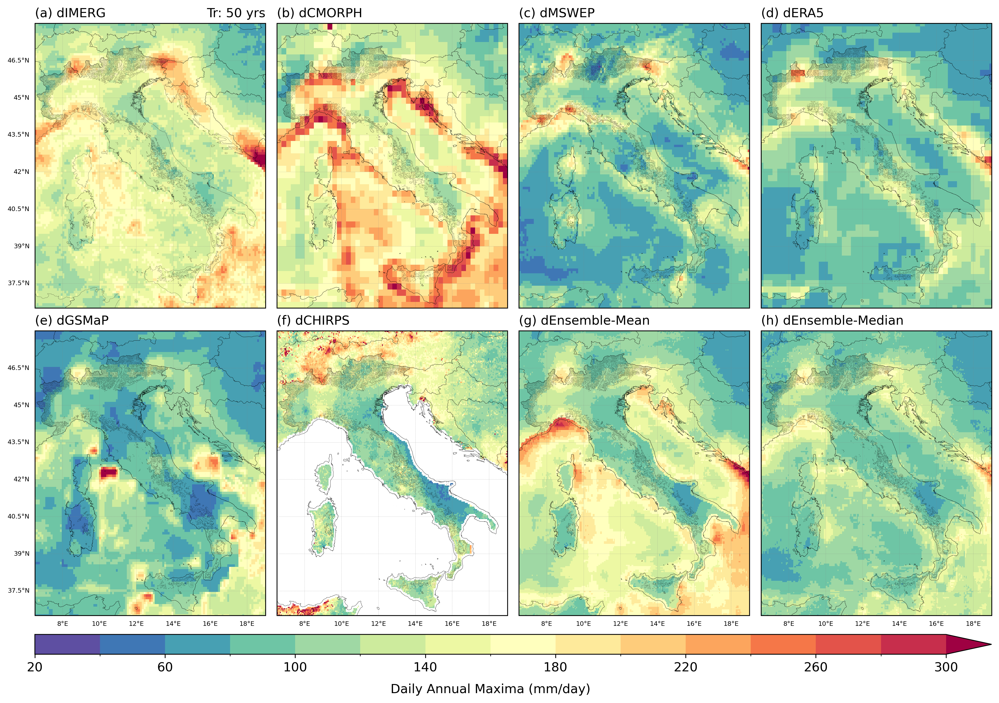

In [224]:
fonttitle = 12

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(14,9),dpi=300)
gs = gridspec.GridSpec(2,4)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.1,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dIM, lat2dIM, MEVd_IM[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dIM, lat2dIM, MEVd_IM[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels = True
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(a) dIMERG', fontsize=fonttitle, loc='left')
ax1.set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='right')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dCM, lat2dCM, MEVd_CM[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dCM, lat2dCM, MEVd_CM[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels =False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(b) dCMORPH', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 2], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dMS, lat2dMS, MEVd_MS[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dMS, lat2dMS, MEVd_MS[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels =False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(c) dMSWEP', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 3], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dER, lat2dER, MEVd_ER[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dER, lat2dER, MEVd_ER[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels = False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(d) dERA5', fontsize=fonttitle, loc='left')

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
ax1 = plt.subplot(gs[1, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dGS, lat2dGS, MEVd_GS[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dGS, lat2dGS, MEVd_GS[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =True
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(e) dGSMaP', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dCH, lat2dCH, MEVd_CH[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dCH, lat2dCH, MEVd_CH[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(f) dCHIRPS', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 2], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dEN, lat2dEN, MEVd_MEAN[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dEN, lat2dEN, MEVd_MEAN[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(g) dEnsemble-Mean', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 3], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dEN, lat2dEN, MEVd_MEDIAN[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dEN, lat2dEN, MEVd_MEDIAN[pos,:,:], cmap=Mev_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(h) dEnsemble-Median', fontsize=fonttitle, loc='left')

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0)

# cbar_ax = fig.add_axes([0.96, 0.075, 0.026, 0.84]) # Vertical
cbar_ax = fig.add_axes([0.05, 0.01, 0.9, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.set_label("Daily Annual Maxima (mm/day)", fontsize=12, labelpad=9)

salida = os.path.join('..','figures','Article_down',f'Quantiles_ALL_DOWN_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

In [134]:
from matplotlib.colors import LinearSegmentedColormap

Diff_cmap = LinearSegmentedColormap.from_list(
    'coolwarm_white',
    [
        (0.0, '#313695'),   # azul oscuro
        (0.45, '#74add1'),  # azul claro
        (0.5, 'white'),     # BLANCO en el centro
        (0.55, '#fdae61'),  # rojo claro
        (1.0, '#a50026')    # rojo oscuro
    ]
)
Diff_levels = np.arange(-40, 42, 2)

from matplotlib.colors import TwoSlopeNorm

# norm = TwoSlopeNorm(
#     vmin=Diff_levels.min(),
#     vcenter=0.0,
#     vmax=Diff_levels.max()
# )

norm = mcolors.BoundaryNorm(boundaries=Diff_levels, ncolors=Diff_cmap.N, extend='both')

Export figure to: ../figures/Article_down/Quantiles_ALL_DIFF_50yrs.png


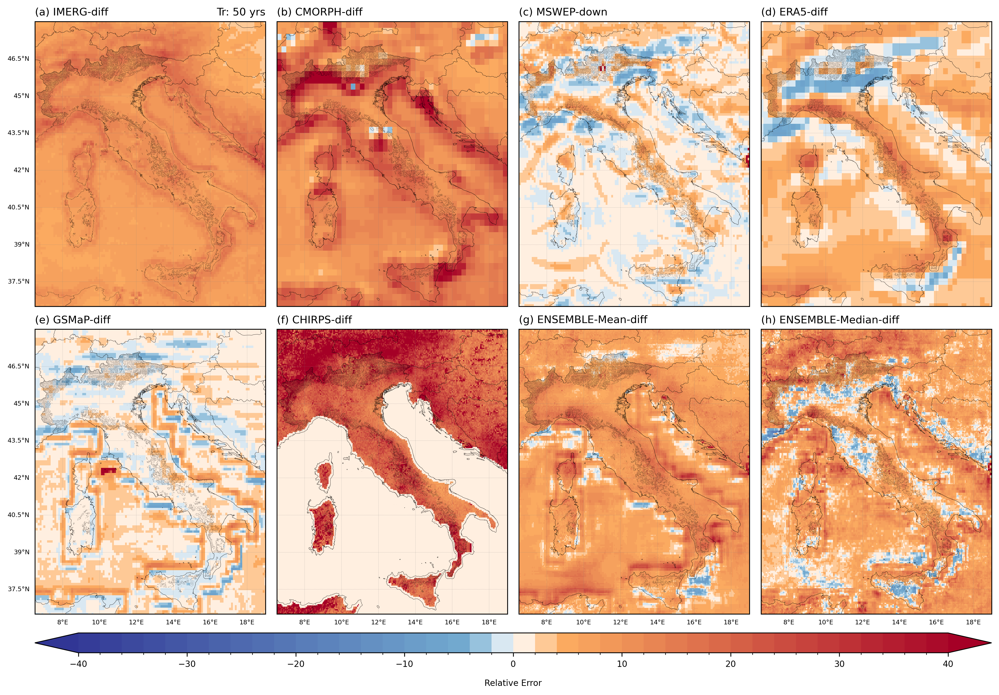

In [135]:
fonttitle = 10

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(14,9),dpi=300)
gs = gridspec.GridSpec(2,4)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.1,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dIM, lat2dIM, MEVd_IM[pos,:,:]-MEVs_IM[pos,:,:], cmap=Diff_cmap, levels=Diff_levels,norm=norm, extend='both')
a1 = ax1.pcolormesh(lon2dIM, lat2dIM, MEVd_IM[pos,:,:]-MEVs_IM[pos,:,:], cmap=Diff_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels = True
gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(a) IMERG-diff', fontsize=fonttitle, loc='left')
ax1.set_title(f'Tr: {Tr[pos]} yrs', fontsize=fonttitle, loc='right')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dCM, lat2dCM, MEVd_CM[pos,:,:]-MEVs_CM[pos,:,:], cmap=Diff_cmap, levels=Diff_levels,norm=norm, extend='both')
a1 = ax1.pcolormesh(lon2dCM, lat2dCM, MEVd_CM[pos,:,:]-MEVs_CM[pos,:,:], cmap=Diff_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(b) CMORPH-diff', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 2], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dMS, lat2dMS, MEVd_MS[pos,:,:]-MEVs_MS[pos,:,:], cmap=Diff_cmap, levels=Diff_levels, norm=norm, extend='both')
a1 = ax1.pcolormesh(lon2dMS, lat2dMS, MEVd_MS[pos,:,:]-MEVs_MS[pos,:,:], cmap=Diff_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(c) MSWEP-down', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 3], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dER, lat2dER, MEVd_ER[pos,:,:]-MEVs_ER[pos,:,:], cmap=Diff_cmap, levels=Diff_levels, norm=norm, extend='both')
a1 = ax1.pcolormesh(lon2dER, lat2dER, MEVd_ER[pos,:,:]-MEVs_ER[pos,:,:], cmap=Diff_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = False
gl.right_labels = False
gl.left_labels = False

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(d) ERA5-diff', fontsize=fonttitle, loc='left')

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
ax1 = plt.subplot(gs[1, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dGS, lat2dGS, MEVd_GS[pos,:,:]-MEVs_GS[pos,:,:], cmap=Diff_cmap, levels=Diff_levels, norm=norm, extend='both')
a1 = ax1.pcolormesh(lon2dGS, lat2dGS, MEVd_GS[pos,:,:]-MEVs_GS[pos,:,:], cmap=Diff_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =True

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(e) GSMaP-diff', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dCH, lat2dCH, MEVd_CH[pos,:,:]-MEVs_CH[pos,:,:], cmap=Diff_cmap, levels=Diff_levels, norm=norm, extend='both')
a1 = ax1.pcolormesh(lon2dCH, lat2dCH, MEVd_CH[pos,:,:]-MEVs_CH[pos,:,:], cmap=Diff_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(f) CHIRPS-diff', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 2], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dEN, lat2dEN, MEVd_MEAN[pos,:,:]-MEVs_MEAN[pos,:,:], cmap=Diff_cmap, levels=Diff_levels, norm=norm, extend='both')
a1 = ax1.pcolormesh(lon2dEN, lat2dEN, MEVd_MEAN[pos,:,:]-MEVs_MEAN[pos,:,:], cmap=Diff_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(g) ENSEMBLE-Mean-diff', fontsize=fonttitle, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 3], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.2,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
# im = REGIONS_merged.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)
# a1 = ax1.contourf(lon2dEN, lat2dEN, MEVd_MEDIAN[pos,:,:]-MEVs_MEDIAN[pos,:,:], cmap=Diff_cmap, levels=Diff_levels, norm=norm, extend='both')
a1 = ax1.pcolormesh(lon2dEN, lat2dEN, MEVd_MEDIAN[pos,:,:]-MEVs_MEDIAN[pos,:,:], cmap=Diff_cmap, norm=norm)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(h) ENSEMBLE-Median-diff', fontsize=fonttitle, loc='left')

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0)

# cbar_ax = fig.add_axes([0.96, 0.075, 0.026, 0.84]) # Vertical
cbar_ax = fig.add_axes([0.05, 0.01, 0.9, 0.029]) # Horizontal
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=8)
cbar.set_label("Relative Error", fontsize=8, labelpad=10)

salida = os.path.join('..','figures','Article_down',f'Quantiles_ALL_DIFF_{Tr[pos]}yrs.png')
print(f'Export figure to: {salida}')
plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Extreme Quantiles for Corrected products

In [5]:
sat_corrected = os.path.join('/','media','arturo','T9','Data','Italy','Satellite','6_DOWN_BCorrected')

DATA = xr.open_dataset(os.path.join(sat_corrected,'ITALY_ENSEMBLE_ALL_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_median_QQc.nc'))
lon2d, lat2d = np.meshgrid(DATA.lon, DATA.lat)

Mev_d_QQC = DATA.Mev_d

In [6]:
ENS_base = os.path.join(sat_base,'5_ENSEMBLE')
ENSEMBLE_SAT = 'ALL'
product, time_reso = 'ENSEMBLE_median', '1dy'
dir_in = os.path.join(ENS_base,f'ITALY_ENSEMBLE_{ENSEMBLE_SAT}_{time_reso}_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_median.nc')

DATA = xr.open_dataset(dir_in)
lon2dEN, lat2dEN = DATA.lon.data, DATA.lat.data

MEVd_MEDIAN = DATA.Mev_d

In [7]:
italy_geom = ITALY.union_all()
mask_italy = sv.contains(italy_geom, lon2d, lat2d)

# Mev_d_QQC_italy = Mev_d_QQC.where(mask_italy)
MEVd_MEDIAN_italy = MEVd_MEDIAN.where(mask_italy) 

In [8]:
Mev_levels = np.arange(60, 390, 10)
Diff_levels = np.arange(-90,100,10)

Export figure to: ../figures/Article_down/Quantiles_corrected.png


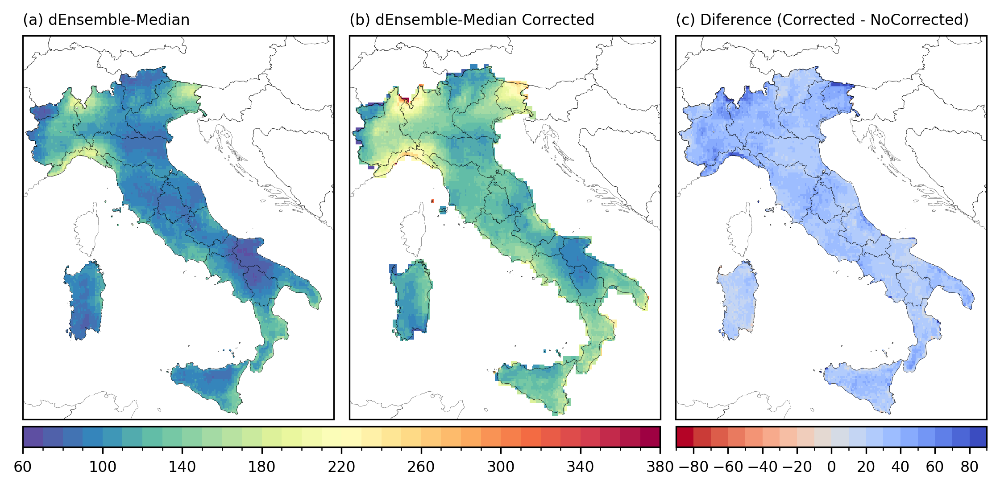

In [9]:
pos = 3

proj = ccrs.PlateCarree()

Mev_cmap = plt.cm.Spectral_r
diff_map = plt.cm.coolwarm_r
norm = mcolors.BoundaryNorm(boundaries=Mev_levels, ncolors=Mev_cmap.N)
norm_diff = mcolors.BoundaryNorm(boundaries=Diff_levels, ncolors=diff_map.N)

fig = plt.figure(figsize=(8,4),dpi=300)
gs = gridspec.GridSpec(1,3)

# ===========================================================================================================================================================================
# ===========================================================================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.1,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
im = REGIONS.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
# DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.3)
# a1 = ax1.contourf(lon2dEN, lat2dEN, MEVd_MEDIAN_italy[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dEN, lat2dEN, MEVd_MEDIAN_italy[pos,:,:], cmap=Mev_cmap, norm=norm)

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04, orientation='horizontal')
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(a) dEnsemble-Median', loc='left', fontsize=8)

# ===========================================================================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.1,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
im = REGIONS.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
# DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.3)
# a1 = ax1.contourf(lon2dEN, lat2dEN, Mev_d_QQC_italy[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a1 = ax1.pcolormesh(lon2dEN, lat2dEN, Mev_d_QQC[pos,:,:], cmap=Mev_cmap, norm=norm)

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04, orientation='horizontal')
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(b) dEnsemble-Median Corrected', loc='left', fontsize=8)

# ===========================================================================================================================================================================
ax1 = plt.subplot(gs[0, 2], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cfeature.COASTLINE,linewidth=0.1,edgecolor='k')
ax1.add_feature(cfeature.BORDERS,linewidth=0.2,edgecolor='black',zorder=4)
im = REGIONS.plot(legend=False, facecolor="none", edgecolor='black', linewidth=0.1, ax=ax1, zorder=10)
# DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.3)
# a1 = ax1.contourf(lon2dEN, lat2dEN, Mev_d_italy[pos,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')
a2 = ax1.pcolormesh(lon2dEN, lat2dEN, Mev_d_QQC[pos,:,:]-MEVd_MEDIAN_italy[pos,:,:], cmap=diff_map, norm=norm_diff)

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04, orientation='horizontal')
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(c) Diference (Corrected - NoCorrected)', loc='left', fontsize=8)

# ===========================================================================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0)

cbar_ax = fig.add_axes([0.05, 0.09, 0.595, 0.038])
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=8)

cbar_ax = fig.add_axes([0.66, 0.09, 0.29, 0.038])
cbar = fig.colorbar(a2, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=8)


salida = os.path.join('..','figures','Article_down',f'Quantiles_corrected.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

In [193]:
np.nanmin(Mev_d_QQC_italy[pos,:,:]-MEVd_MEDIAN_italy[pos,:,:]), np.nanmax(Mev_d_QQC_italy[pos,:,:]-MEVd_MEDIAN_italy[pos,:,:])

(-6.8075272530398365, 87.74667248271354)